# Task A: Implementation of IoU


In [4]:
!pip install numpy tensorflow 

You should consider upgrading via the 'C:\Users\janni\TUMai\notebooks\venv\Scripts\python.exe -m pip install --upgrade pip' command.


In [5]:
import numpy as np
import tensorflow as tf

In [6]:
def iou(box1, box2):
    """Implement the intersection over union (IoU) between box1 and box2
    Arguments:
    box1 -- first box, list object with coordinates (x1, y1, x2, y2)
    box2 -- second box, list object with coordinates (x1, y1, x2, y2)
    """

    # Calculate the (y1, x1, y2, x2) coordinates of the intersection of box1 and box2.
    # Calculate the intersection area.
    # If the boxes do not overlap, the intersection area must be 0
    xi1 = np.maximum(box1[0], box2[0])
    yi1 = np.maximum(box1[1], box2[1])
    xi2 = np.minimum(box1[2], box2[2])
    yi2 = np.minimum(box1[3], box2[3])
    # Case in which they don't intersec --> max(,0)
    intersection_area = max(xi2-xi1, 0)*max(yi2-yi1, 0)

    # Calculate the union area by using the formula: Union(A,B) = A + B - Intersection(A,B)
    box1_area = (box1[2]-box1[0])*(box1[3]-box1[1])
    box2_area = (box2[2]-box2[0])*(box2[3]-box2[1])
    union_area = box1_area + box2_area - intersection_area

    # compute the IoU
    iou = float(intersection_area)/float(union_area)

    return iou

In [7]:
box1 = (2, 1, 4, 3)
box2 = (1, 2, 3, 4) 
print("iou = " + str(iou(box1, box2)))

iou = 0.14285714285714285


# Task B: Implementation of YOLO filter boxes

In [8]:
def yolo_filter_boxes(box_confidence, boxes, box_class_probs, threshold=.6):
    """Filters YOLO boxes by thresholding on object and class confidence.
    
    Arguments:
    box_confidence -- tensor of shape (19, 19, 5, 1)
    boxes -- tensor of shape (19, 19, 5, 4)
    box_class_probs -- tensor of shape (19, 19, 5, 80)
    threshold -- real value, if [ highest class probability score < threshold], then get rid of the corresponding box
    
    Returns:
    scores -- tensor of shape (None,), containing the class probability score for selected boxes
    boxes -- tensor of shape (None, 4), containing (b_x, b_y, b_h, b_w) coordinates of selected boxes
    classes -- tensor of shape (None,), containing the index of the class detected by the selected boxes
    
    Note: "None" is here because you don't know the exact number of selected boxes, as it depends on the threshold. 
    For example, the actual output size of scores would be (10,) if there are 10 boxes.
    """
    
    # Step 1: Compute box scores
    box_scores = box_confidence * box_class_probs

    # Step 2: Find the box_classes thanks to the max box_scores, keep track of the corresponding score
    # For each of the bounding boxes, index of the maximum value of the probability vector.
    box_classes = tf.keras.backend.argmax(box_scores, axis=-1)
    # Maximum probability fro each of the bounding boxes
    # Dim (19, 19, 5) The max value of each bounding box pc*class
    # Dim (19, 19, 5, 1) if keep_dims=True. This keeps the vector for each bounding box with only the max value.
    box_class_scores = tf.keras.backend.max(box_scores, axis=-1)

    # Step 3: Create a filtering mask based on "box_class_scores" by using "threshold". The mask should have the
    # same dimension as box_class_scores, and be True for the boxes you want to keep (with probability >= threshold)
    filtering_mask = box_class_scores > threshold

    # Step 4: Apply the mask to scores, boxes and classes
    scores = tf.boolean_mask(box_class_scores, filtering_mask)
    boxes = tf.boolean_mask(boxes, filtering_mask)
    classes = tf.boolean_mask(box_classes, filtering_mask)

    return scores, boxes, classes

In [9]:
tf.random.set_seed(42)
box_confidence = tf.random.normal([19, 19, 5, 1], mean=1, stddev=4, seed = 1)
boxes = tf.random.normal([19, 19, 5, 4], mean=1, stddev=4, seed = 1)
box_class_probs = tf.random.normal([19, 19, 5, 80], mean=1, stddev=4, seed = 1)

In [10]:
scores, boxes, classes = yolo_filter_boxes(box_confidence, boxes, box_class_probs, threshold = 0.5)
print("scores[2] = " + str(scores[2].numpy()))
print("boxes[2] = " + str(boxes[2].numpy()))
print("classes[2] = " + str(classes[2].numpy()))
print("scores.shape = " + str(scores.shape))
print("boxes.shape = " + str(boxes.shape))
print("classes.shape = " + str(classes.shape))

scores[2] = 26.637585
boxes[2] = [ 3.6244028 -1.2655535  1.6726924  3.6594343]
classes[2] = 28
scores.shape = (1785,)
boxes.shape = (1785, 4)
classes.shape = (1785,)


# Task C: Implement non-max suppression

In [11]:
def yolo_non_max_suppression(scores, boxes, classes, max_boxes=10, iou_threshold=0.5):
    """
    Applies Non-max suppression (NMS) to set of boxes

    Arguments:
    scores -- tensor of shape (None,), output of yolo_filter_boxes()
    boxes -- tensor of shape (None, 4), output of yolo_filter_boxes() that have been scaled to the image size (see later)
    classes -- tensor of shape (None,), output of yolo_filter_boxes()
    max_boxes -- integer, maximum number of predicted boxes you'd like
    iou_threshold -- real value, "intersection over union" threshold used for NMS filtering

    Returns:
    scores -- tensor of shape (, None), predicted score for each box
    boxes -- tensor of shape (4, None), predicted box coordinates
    classes -- tensor of shape (, None), predicted class for each box

    Note: The "None" dimension of the output tensors has obviously to be less than max_boxes. Note also that this
    function will transpose the shapes of scores, boxes, classes. This is made for convenience.
    """

    # Use tf.image.non_max_suppression() to get the list of indices corresponding to boxes you keep
    nms_indices = tf.image.non_max_suppression(boxes, scores, max_output_size=max_boxes, iou_threshold=iou_threshold)

    # Use tf.keras.backend.gather() to select only nms_indices from scores, boxes and classes
    # Using the index for the boxes left, get the scores, box, and classes for each.
    scores = tf.keras.backend.gather(scores, nms_indices)
    boxes = tf.keras.backend.gather(boxes, nms_indices)
    classes = tf.keras.backend.gather(classes, nms_indices)

    return scores, boxes, classes

In [12]:
tf.random.set_seed(42)
scores = tf.random.normal([54,], mean=1, stddev=4, seed = 1)
boxes = tf.random.normal([54, 4], mean=1, stddev=4, seed = 1)
classes = tf.random.normal([54,], mean=1, stddev=4, seed = 1)
scores, boxes, classes = yolo_non_max_suppression(scores, boxes, classes)
print("scores[2] = " + str(scores[2].numpy()))
print("boxes[2] = " + str(boxes[2].numpy()))
print("classes[2] = " + str(classes[2].numpy()))
print("scores.shape = " + str(scores.numpy().shape))
print("boxes.shape = " + str(boxes.numpy().shape))
print("classes.shape = " + str(classes.numpy().shape))

scores[2] = 8.131492
boxes[2] = [-4.2837634  -3.896964   -9.95371    -0.30319464]
classes[2] = -5.424111
scores.shape = (10,)
boxes.shape = (10, 4)
classes.shape = (10,)


# Fine-tuning YOLOv5

Let's clone the github repo first.

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd /content/yolov5/

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5


Next, we need to install the dependencies.

In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
# from utils.downloads import gdrive_download  # to download models/datasets

This will output the installed pytorch version and available GPU. If no GPU is detected, the code will run on CPU.

In [ ]:
print('Setup complete. Using torch %s on device %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'cpu'))

Setup complete. Using torch 1.12.1+cu113 on device _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
# We already pasted the code for you
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="9XuVNjg7jr9GhQdxhvRg")
project = rf.workspace("roboflow-gw7yv").project("self-driving-car")
dataset = project.version(3).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...

Extracting Dataset Version Zip to Self-Driving-Car-3 in yolov5pytorch:: 100%|██████████| 59606/59606 [00:21<00:00, 2747.31it/s]


Now that the dataset is downloaded, we have to perform a train-validation-test split. The project already comes with an autosplit function that performs the split.  
Afterwards, we simply have to adjust the yaml config file accordingly.

In [ ]:
from utils.dataloaders import autosplit
import yaml

autosplit('./Self-Driving-Car-3/export', weights=(0.8, 0.1, 0.1))

with open("./Self-Driving-Car-3/data.yaml") as f:
     data = yaml.safe_load(f)

data["train"] = "Self-Driving-Car-3/autosplit_train.txt"
data["val"] = "Self-Driving-Car-3/autosplit_val.txt"
data["test"] = "Self-Driving-Car-3/autosplit_test.txt"

with open("./Self-Driving-Car-3/data.yaml", "w") as f:
    yaml.dump(data, f)

Autosplitting images from Self-Driving-Car-3/export


100%|██████████| 29800/29800 [00:02<00:00, 10734.51it/s]


Since inference can unfortunately not use the txt file directly, we need to move all images listed in autosplit_test.txt to a separate folder.

In [ ]:
%cd /content/yolov5/Self-Driving-Car-3/

/content/yolov5/Self-Driving-Car-3


In [ ]:
import shutil
import os

os.makedirs(f"{dataset.location}/test/images", exist_ok=True)
os.makedirs(f"{dataset.location}/test/labels", exist_ok=True)

with open(f"{dataset.location}/autosplit_test.txt") as test_files:
    for filename in test_files:
        filename = filename.strip()
        if os.path.exists(filename):
          filename_label = (filename[:-3]+"txt").replace("images", "labels")
          new_filename_image = os.path.join(f"{dataset.location}/test/images", filename.split("/")[-1])
          new_filename_label = os.path.join(f"{dataset.location}/test/labels", filename.split("/")[-1][:-3]+"txt")
          shutil.move(filename, new_filename_image)
          shutil.move(filename_label, new_filename_label)

In [ ]:
%cd /content/yolov5/

/content/yolov5


### Part 4: Training the YOLOv5 model

We train for 10 epochs instead of 2

In [ ]:
%cd /content/yolov5/

/content/yolov5


In [ ]:
!python train.py --img 512 --batch 32 --epochs 10 --data {dataset.location}/data.yaml --weights yolov5s.pt --device {"0" if torch.cuda.is_available() else "cpu"}

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/Self-Driving-Car-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=32, imgsz=512, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=0, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-231-g0039870 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, h

### Part 5: Evaluating the performance on the validation set

**Local Logging:**

Results during training are automatically logged with [Tensorboard](https://www.tensorflow.org/tensorboard) and [CSV](https://github.com/ultralytics/yolov5/pull/4148) loggers to `runs/train`, with a new experiment directory created for each new training as `runs/train/exp2`, `runs/train/exp3`, etc.

This directory contains train and val statistics, mosaics, labels, predictions, and augmented mosaics, as well as metrics and charts including precision-recall (PR) curves and confusion matrices. 

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%reload_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

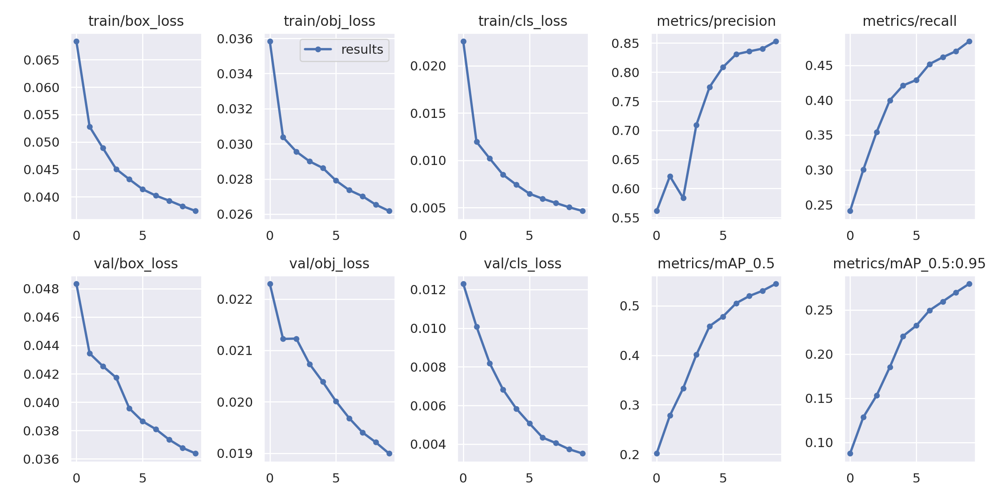

In [ ]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/exp/results.png', width=1000)  # view results.png

GROUND TRUTH VALIDATION DATA:


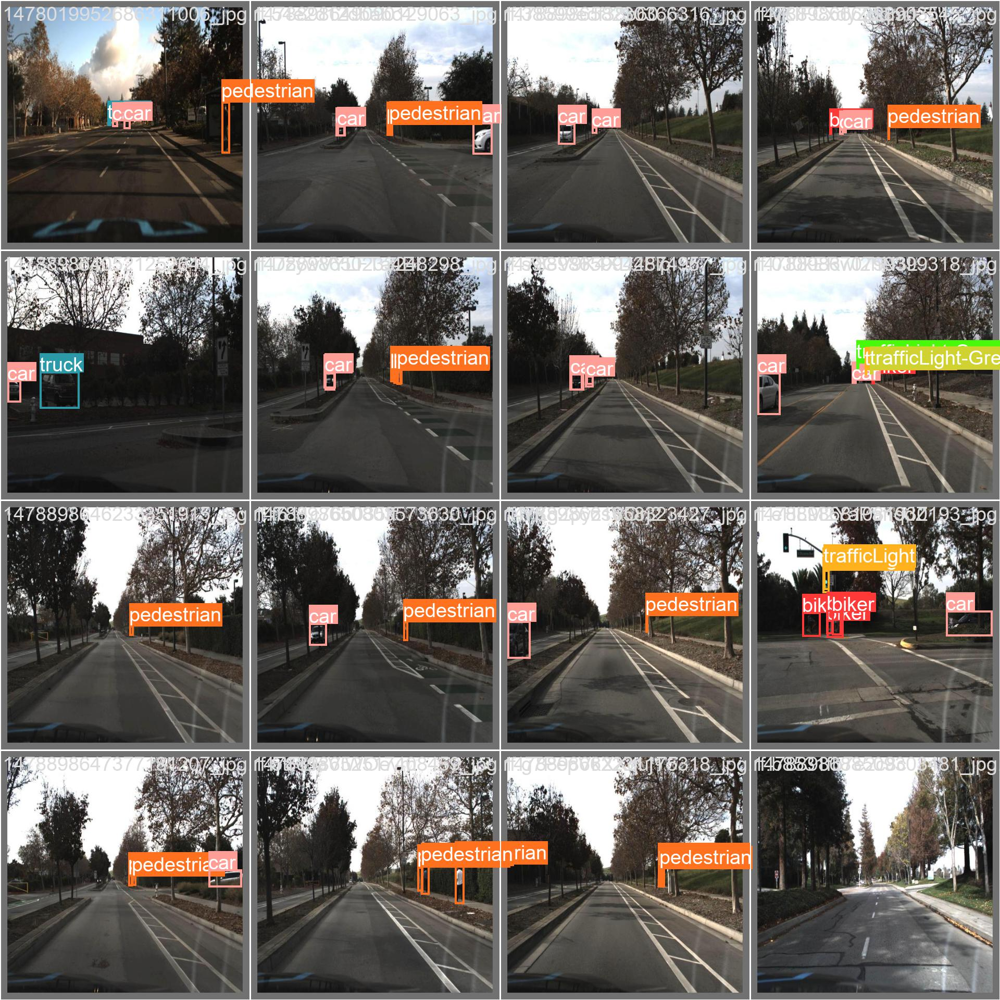

In [ ]:
# first, display our ground truth validation data
print("GROUND TRUTH VALIDATION DATA:")
Image(filename='/content/yolov5/runs/train/exp/val_batch0_labels.jpg', width=900)

PREDICTION VALIDATION DATA:


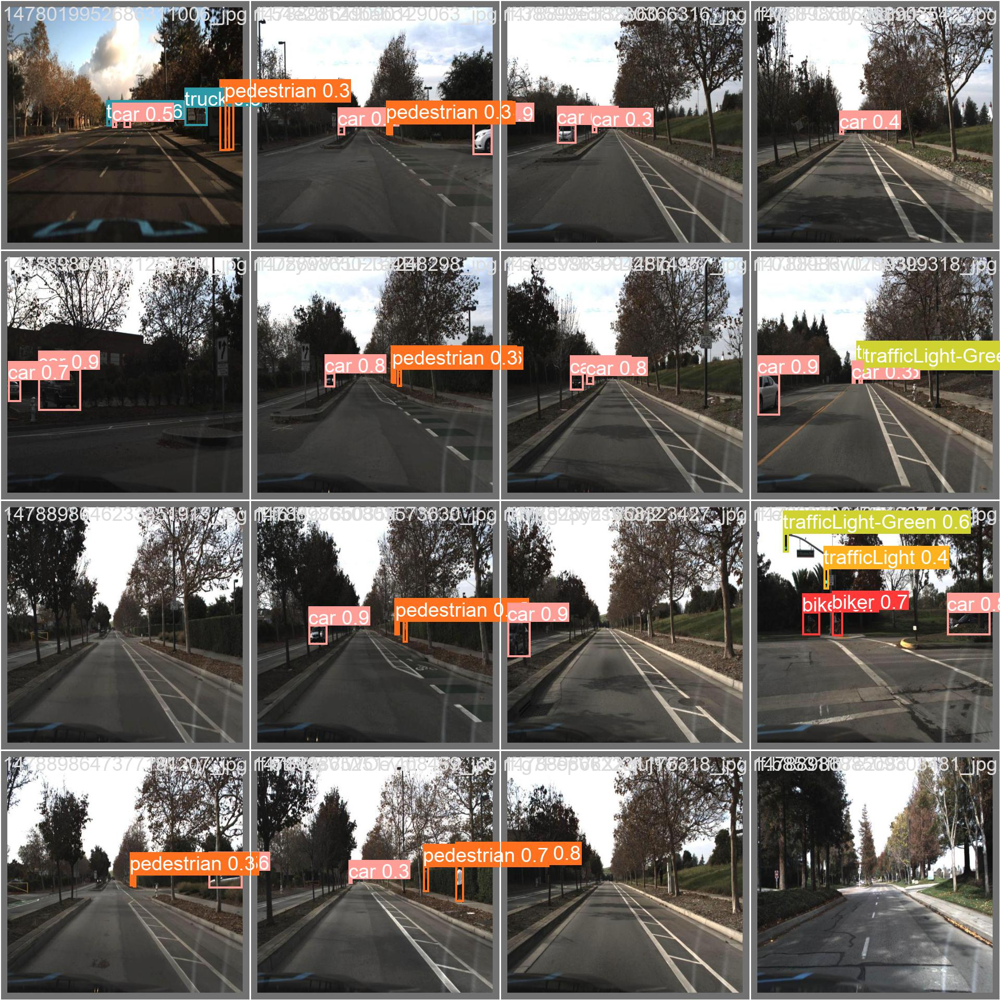

In [ ]:
# second, display the predictions on the validation data
print("PREDICTION VALIDATION DATA:")
Image(filename='/content/yolov5/runs/train/exp/val_batch0_pred.jpg', width=900)

### Part 6: Running inference on the test set

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 512 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/Self-Driving-Car-3/test/images, data=data/coco128.yaml, imgsz=[512, 512], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-231-g0039870 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7039792 parameters, 0 gradients, 15.8 GFLOPs
image 1/2976 /content/yolov5/Self-Driving-Car-3/test/images/1478019955185244088_jpg.rf.gJpj2eCO1Dd7Sic9WlhE.jpg: 512x512 4 cars, 9.0ms
image 2/2976 /content/yolov5/Self-Driving-Car-3/test/images/1478019956680248165_jpg.rf.wBTBnKX8QeE4p8Zywg3O.jpg: 512x512 2 cars, 2 trucks, 9.0ms
image 3/2976 /content/yolov5/Self-Drivi

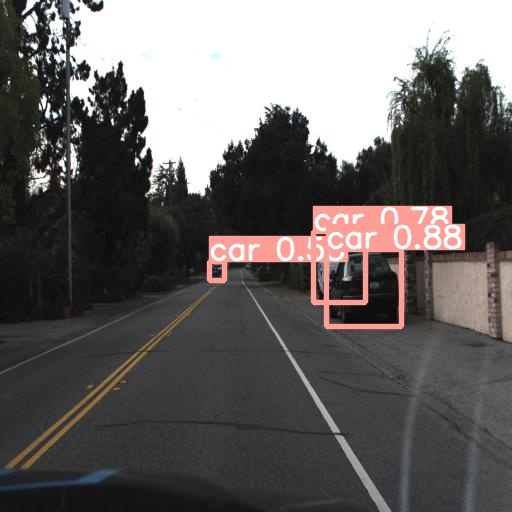

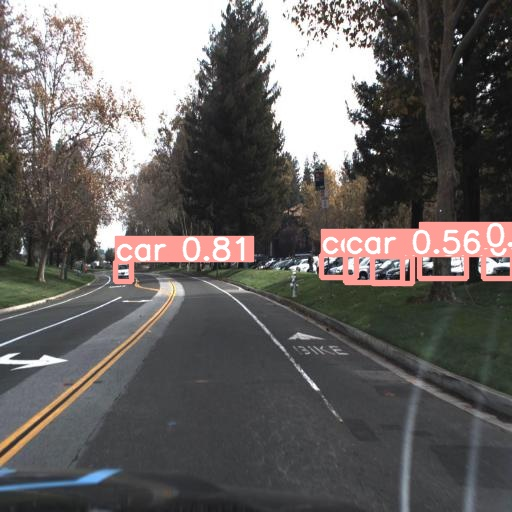

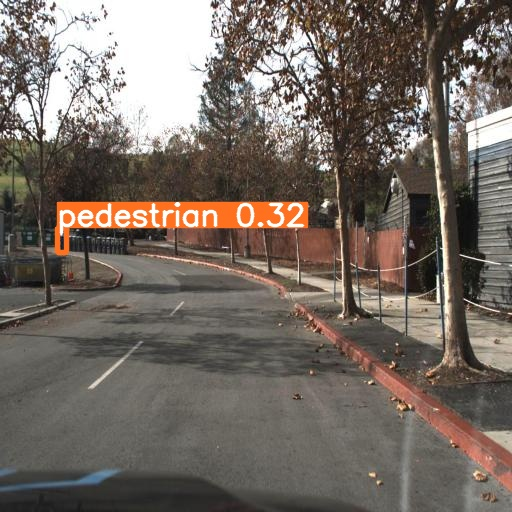

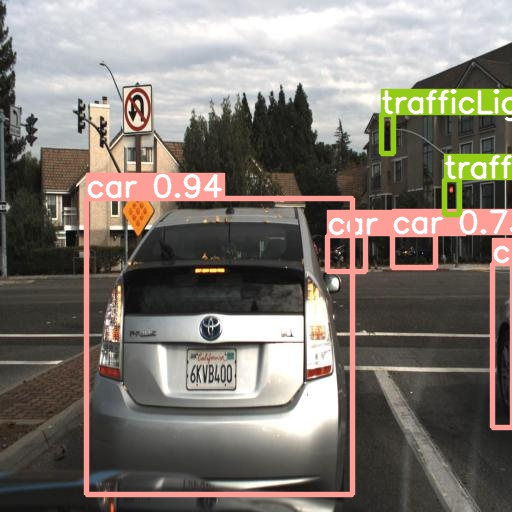

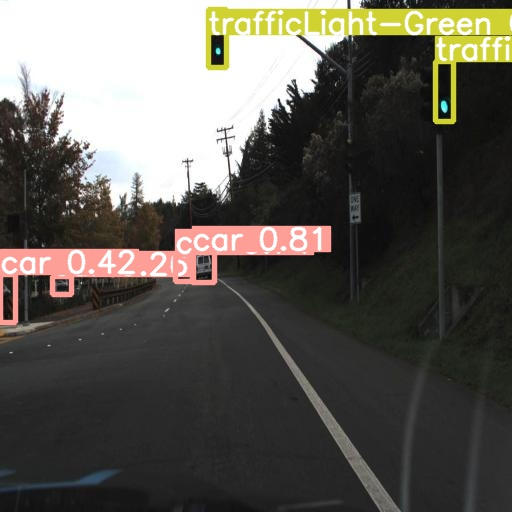

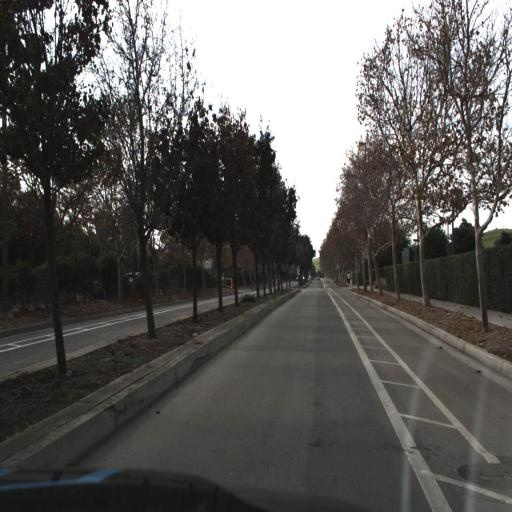

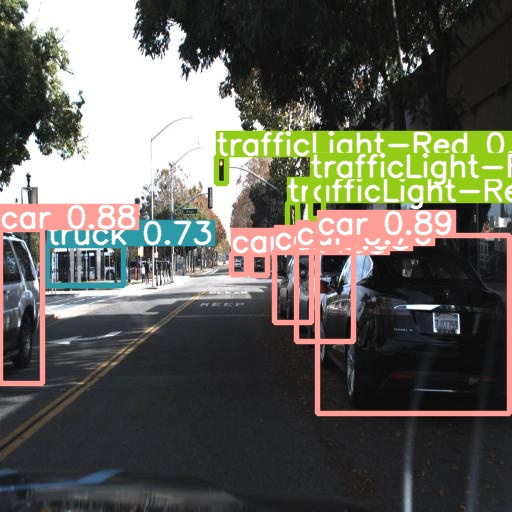

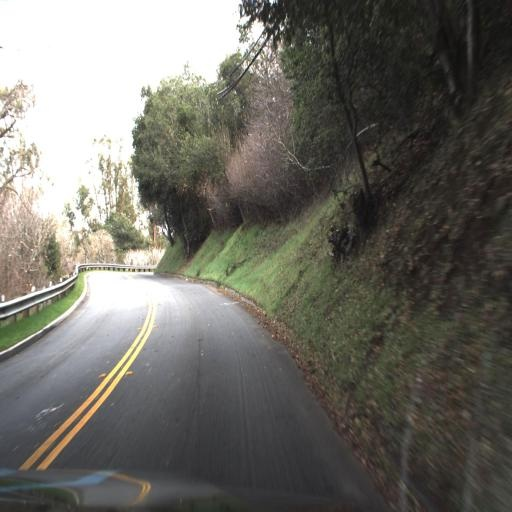

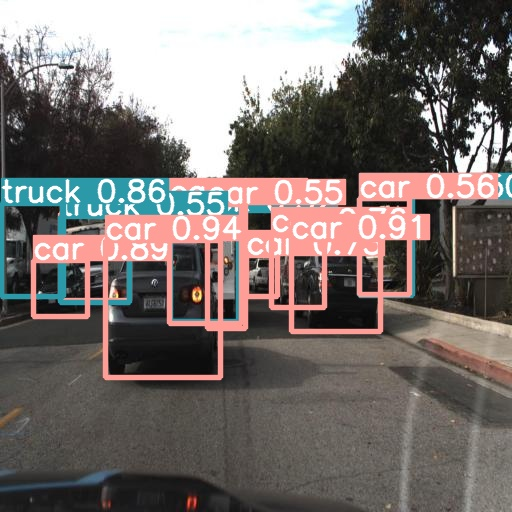

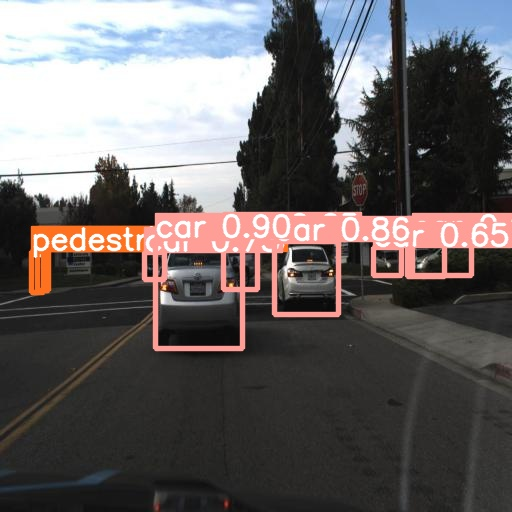

In [ ]:
#display inference on the first 10  test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg')[:10]:
    display(Image(filename=imageName))